Plotting Installed Capacity...


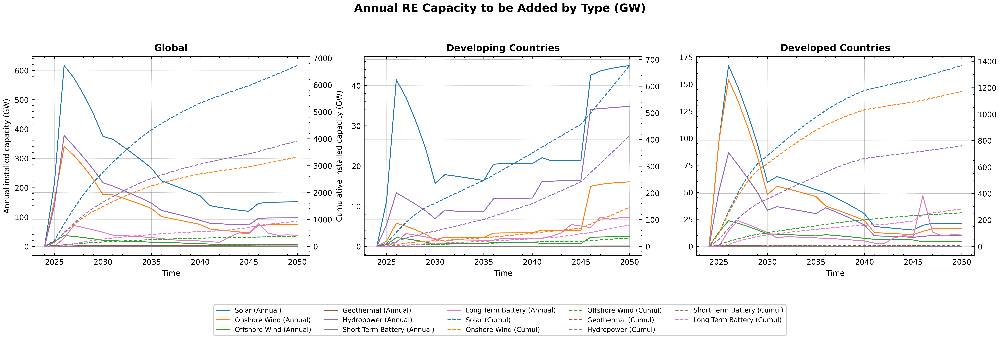

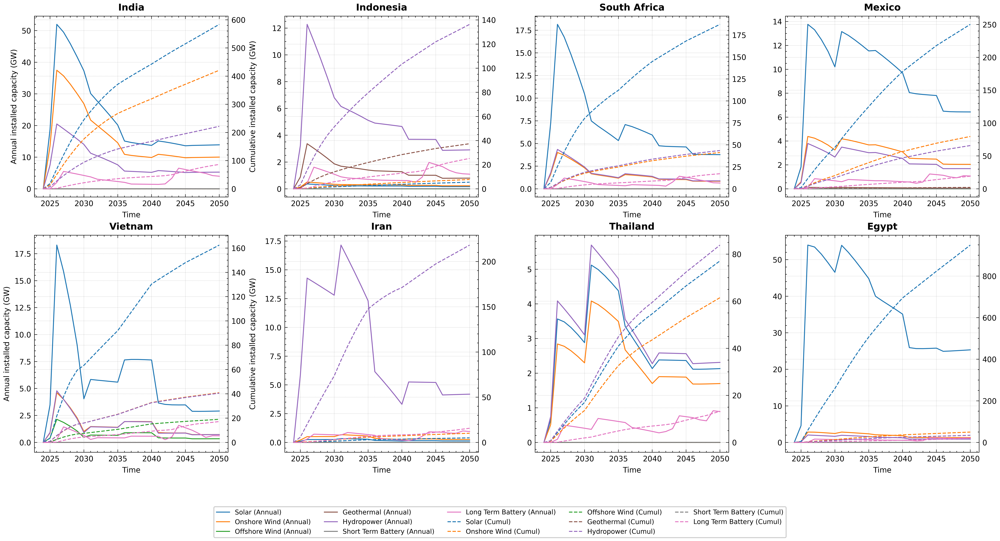

Plotting Active Stock...


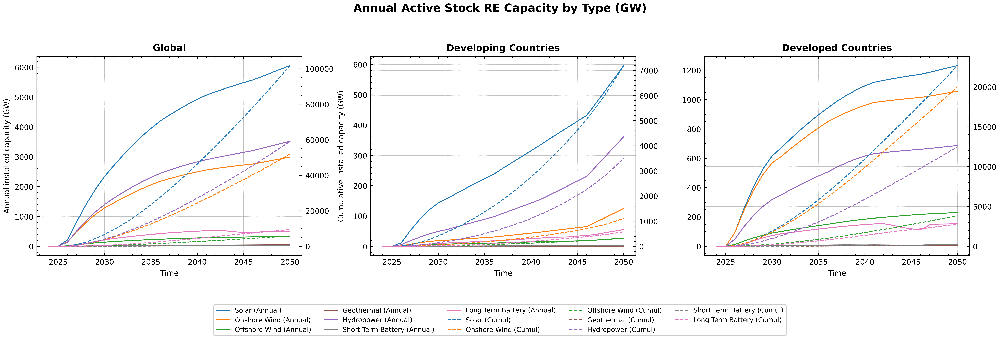

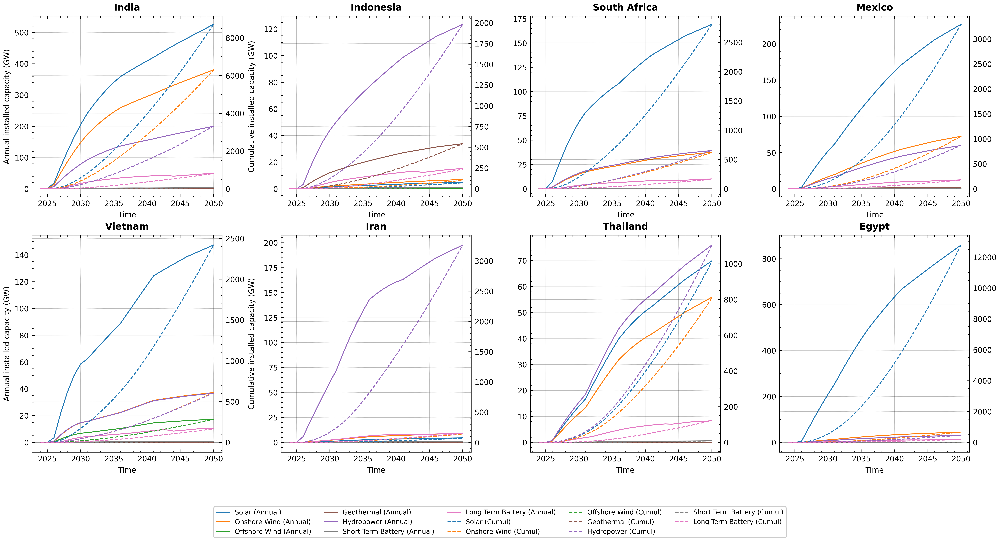

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import os
import glob
import scienceplots

# Set up SciencePlots and disable LaTeX
plt.style.use(['science', 'ieee', 'grid'])
plt.rcParams.update({
    'text.usetex': False,  # Disable LaTeX
    'font.family': ['sans-serif'],  # Use default fonts
    'axes.labelsize': 8,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7,
    'axes.linewidth': 0.5,
    'grid.linewidth': 0.2,
    'lines.linewidth': 1.0,
    'grid.alpha': 0.3,
    'axes.grid': True,
    'axes.axisbelow': True
})

def read_json_files(file_pattern):
    data = {}
    for file in glob.glob(file_pattern):
        basename = os.path.basename(file)
        if 'Net Zero 2050' not in basename:
            continue
            
        if 'Developing_UNFCCC' in basename:
            key = 'Developing_UNFCCC'
        elif 'Developed_UNFCCC' in basename:
            key = 'Developed_UNFCCC'
        else:
            key = basename.split('_')[-1].split('.')[0]
            
        with open(file, 'r') as f:
            json_data = json.load(f)
            for k, value in json_data.items():
                json_data[k] = {int(year): val / 1e6 for year, val in value.items()}
        data[key] = json_data
    return data

def calculate_cumulative(annual_data):
    cumulative = {}
    for region, techs in annual_data.items():
        cumulative[region] = {}
        for tech, values in techs.items():
            sorted_years = sorted(values.keys())
            cumulative[region][tech] = {}
            cum_sum = 0
            for year in sorted_years:
                cum_sum += values[year]
                cumulative[region][tech][year] = cum_sum
    return cumulative

def plot_region(ax, annual_data, cumul_data, region_name, show_ylabel=True):
    # Create twin axis
    ax2 = ax.twinx()
    
    colors = {
        'solar': '#1f77b4',
        'onshore_wind': '#ff7f0e',
        'offshore_wind': '#2ca02c',
        'hydropower': '#9467bd',
        'geothermal': '#8c564b',
        'long': '#e377c2',
        'short': '#7f7f7f'
    }
    
    # Plot data
    for tech in annual_data:
        years = sorted(annual_data[tech].keys())
        annual_values = [annual_data[tech][year] for year in years]
        cumul_values = [cumul_data[tech][year] for year in years]
        
        # Annual on left axis (solid line)
        ax.plot(years, annual_values, '-', color=colors.get(tech, None), 
                label=f'{tech} (Annual)')
        # Cumulative on right axis (dashed line)
        ax2.plot(years, cumul_values, '--', color=colors.get(tech, None), 
                 label=f'{tech} (Cumul)')
    
    # Configure axes - always show ticks for both axes
    if show_ylabel:
        ax.set_ylabel('Annual installed capacity (GW)')
        ax2.set_ylabel('Cumulative installed capacity (GW)')
    
    # Ensure both y-axes show their scales
    ax.yaxis.set_major_locator(plt.AutoLocator())
    ax2.yaxis.set_major_locator(plt.AutoLocator())
    
    # Only hide labels (but not ticks) for non-leftmost plots
    if not show_ylabel:
        ax.set_ylabel('')
        ax2.set_ylabel('')
    
    ax.set_xlabel('Time')
    ax.set_title(region_name, fontweight='bold', fontsize=10)
    ax.grid(True, alpha=0.3)
    
    # Set x-axis ticks
    ax.set_xticks([2025, 2030, 2035, 2040, 2045, 2050])
    ax.set_xticklabels(['2025', '2030', '2035', '2040', '2045', '2050'])
    
    # Ensure grid is below plots
    ax.set_axisbelow(True)
    
    return ax, ax2

def plot_world_regions(installed_data, cumulative_data, title):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
    
    regions = ['WORLD', 'Developing_UNFCCC', 'Developed_UNFCCC']
    names = ['Global', 'Developing Countries', 'Developed Countries']
    
    # Plot each region
    ax1, ax1_twin = plot_region(ax1, installed_data[regions[0]], 
                               cumulative_data[regions[0]], names[0], True)
    ax2, ax2_twin = plot_region(ax2, installed_data[regions[1]], 
                               cumulative_data[regions[1]], names[1], False)
    ax3, ax3_twin = plot_region(ax3, installed_data[regions[2]], 
                               cumulative_data[regions[2]], names[2], False)
    
    # Get handles and labels for legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax1_twin.get_legend_handles_labels()
    
    # Clean up labels
    labels1 = [label.replace('_', ' ').replace('short', 'Short term battery')
              .replace('long', 'Long term battery').title() for label in labels1]
    labels2 = [label.replace('_', ' ').replace('short', 'Short term battery')
              .replace('long', 'Long term battery').title() for label in labels2]
    
    # Add legend
    fig.legend(lines1 + lines2, labels1 + labels2, 
              loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.2))
    
    plt.suptitle(title, y=1.05, fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

def plot_countries(installed_data, cumulative_data):
    fig = plt.figure(figsize=(15, 8))
    gs = fig.add_gridspec(2, 4, height_ratios=[1, 1.2])  # Adjusted height ratios to make room for legend
    
    countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG']
    names = ['India', 'Indonesia', 'South Africa', 'Mexico', 
             'Vietnam', 'Iran', 'Thailand', 'Egypt']
    
    # Store first axes for legend
    first_ax = None
    first_ax_twin = None
    
    for i, (country, name) in enumerate(zip(countries, names)):
        ax = fig.add_subplot(gs[i//4, i%4])
        plot_ax, plot_ax_twin = plot_region(ax, installed_data[country], 
                                          cumulative_data[country], 
                                          name, show_ylabel=(i%4==0))
        
        # Store the first set of axes for legend
        if i == 0:
            first_ax = plot_ax
            first_ax_twin = plot_ax_twin
    
    # Get handles and labels for legend
    lines1, labels1 = first_ax.get_legend_handles_labels()
    lines2, labels2 = first_ax_twin.get_legend_handles_labels()
    
    # Clean up labels
    labels1 = [label.replace('_', ' ').replace('short', 'Short term battery')
              .replace('long', 'Long term battery').title() for label in labels1]
    labels2 = [label.replace('_', ' ').replace('short', 'Short term battery')
              .replace('long', 'Long term battery').title() for label in labels2]
    
    # Add legend below the plots
    fig.legend(lines1 + lines2, labels1 + labels2, 
              loc='center', ncol=5, bbox_to_anchor=(0.5, 0.02))
    
    plt.tight_layout()
    # Adjust the layout to prevent legend overlap
    plt.subplots_adjust(bottom=0.15)
    plt.show()

# Read and process both installed and active stock data
base_path = '/Users/yukthabhadane/Documents/Climate Finance Thesis/Paper Alissa Jan 2025/RE capacity'

# Read installed capacity data
installed_pattern = os.path.join(base_path, 'battery_yearly_installed_capacity_Net Zero 2050*.json')
installed_data = read_json_files(installed_pattern)
installed_cumulative = calculate_cumulative(installed_data)

# Read active stock data
active_pattern = os.path.join(base_path, 'battery_yearly_available_capacity_Net Zero 2050*.json')
active_data = read_json_files(active_pattern)
active_cumulative = calculate_cumulative(active_data)

# Create plots for installed capacity
print("Plotting Installed Capacity...")
plot_world_regions(installed_data, installed_cumulative, 
                  'Annual RE Capacity to be Added by Type (GW)')
plot_countries(installed_data, installed_cumulative)

# Create plots for active stock
print("Plotting Active Stock...")
plot_world_regions(active_data, active_cumulative, 
                  'Annual Active Stock RE Capacity by Type (GW)')
plot_countries(active_data, active_cumulative)

Energy Mix

/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_33942/791629801.py:68: DtypeWarning: Columns (9,15,17,23,32,33) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')


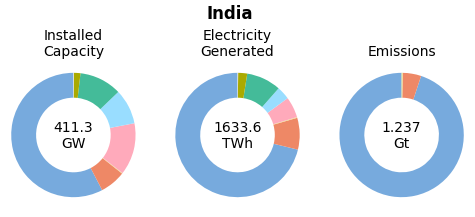

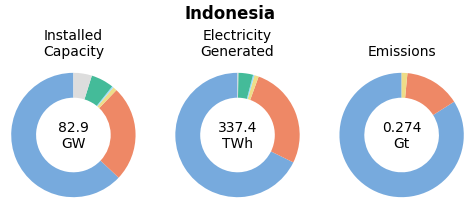

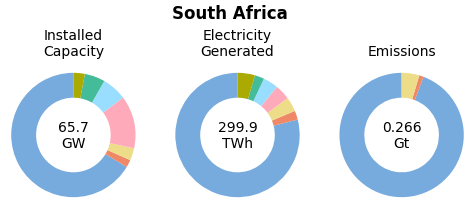

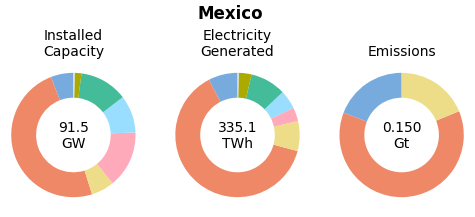

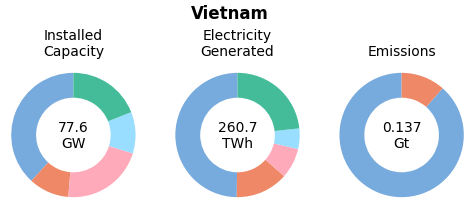

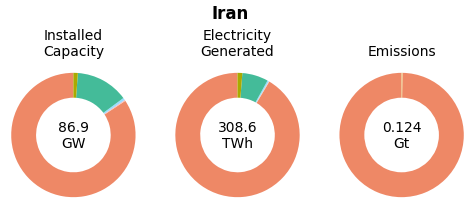

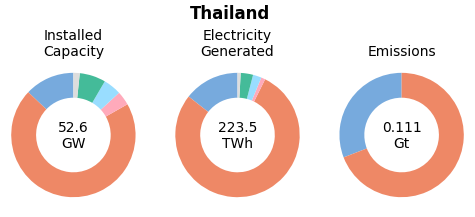

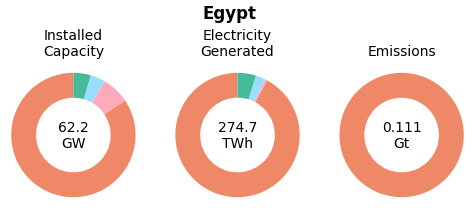

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scienceplots

def format_value(value, metric):
    if metric == 'capacity':
        gw_value = value / 1000
        return f'{gw_value:.1f}\nGW'
    elif metric == 'activity':
        twh_value = value / 1_000_000
        return f'{twh_value:.1f}\nTWh'
    else:  
        gt_value = value / 1000
        return f'{gt_value:.3f}\nGt'

def create_country_block(df, country_code, country_name):
    fig, axes = plt.subplots(1, 3, figsize=(6, 2))  # Reduced figure size
    fig.suptitle(country_name, fontsize=12,fontweight='bold',y=1.15)  # Adjusted title position
    
    subsectors = ['Coal', 'Gas', 'Oil', 'Solar', 'Wind', 'Hydropower', 
                 'Geothermal', 'Nuclear', 'Bioenergy']
    metrics = ['capacity', 'activity', 'annualco2tyear']
    titles = ['Installed\nCapacity', 'Electricity\nGenerated', 'Emissions']
    
    mask = (df['status'] == 'operating') & (df['asset_location'] == country_code)
    
    for ax, metric, title in zip(axes, metrics, titles):
        data = df[mask].groupby('subsector')[metric].sum()
        data = data.reindex(subsectors).fillna(0)
        total_value = data.sum()
        
        if total_value > 0:
            wedges, _ = ax.pie(data, wedgeprops=dict(width=0.4), startangle=90)
            # Move value label inside the donut
            ax.text(0, 0, format_value(total_value, metric),
                   ha='center', va='center', fontsize=10)
        
        ax.set_title(title, pad=0, fontsize=10)  # Reduced padding
        ax.axis('equal')
    

def create_visualizations(df):
    plt.style.use(['science', 'nature', 'light'])
    
    plt.rcParams.update({
        'font.size': 10,  # Reduced font size
        'font.family': 'DejaVu Sans',
        'axes.linewidth': 0.5,
        'grid.linewidth': 0.5,
        'lines.linewidth': 1,
        'lines.markersize': 3,
        'text.usetex': False,
    })
    
    countries = [
        ('IN', 'India'), ('ID', 'Indonesia'), ('ZA', 'South Africa'),
        ('MX', 'Mexico'), ('VN', 'Vietnam'), ('IR', 'Iran'),
        ('TH', 'Thailand'), ('EG', 'Egypt')
    ]
    
    for code, name in countries:
        fig = create_country_block(df, code, name)
        plt.show()
        plt.close()

def main():
    df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')
    unfccc_df = pd.read_excel('/Users/yukthabhadane/Documents/Climate Finance Thesis/Policy Brief/UNFCCC classification.xlsx')
    
    location_to_group = dict(zip(unfccc_df['asset_location'], unfccc_df['group']))
    df['unfccc_group'] = df['asset_location'].map(location_to_group)
    
    create_visualizations(df)

if __name__ == "__main__":
    main()

/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_33942/3350916240.py:80: DtypeWarning: Columns (9,15,17,23,32,33) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')


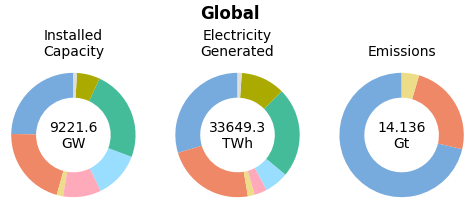

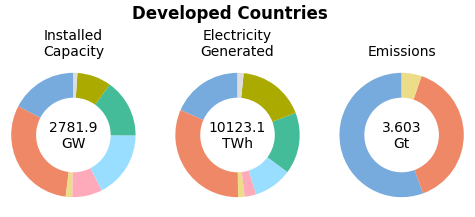

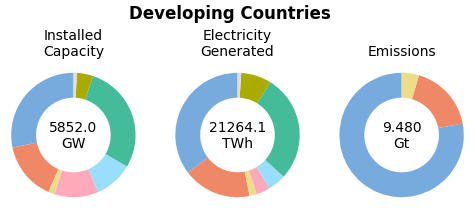

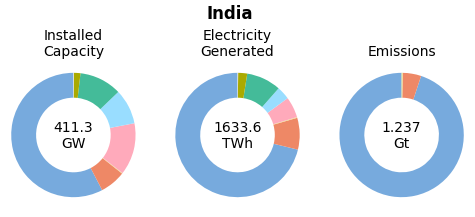

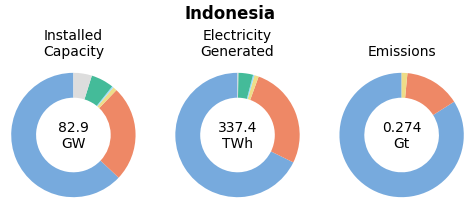

...

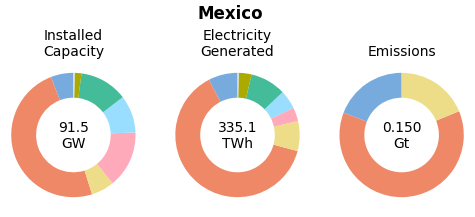

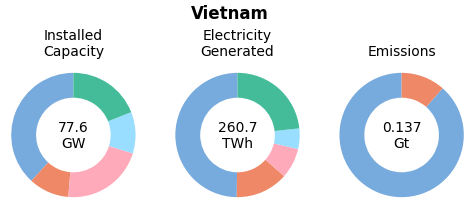

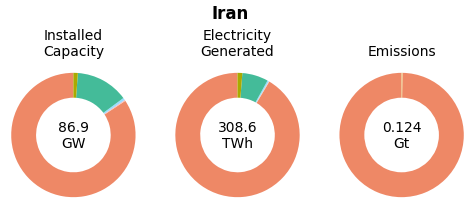

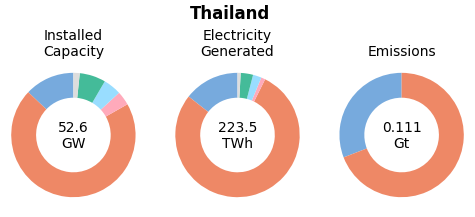

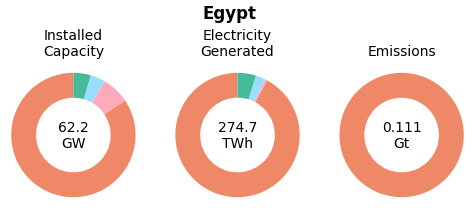

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scienceplots

def format_value(value, metric):
    if metric == 'capacity':
        gw_value = value / 1000
        return f'{gw_value:.1f}\nGW'
    elif metric == 'activity':
        twh_value = value / 1_000_000
        return f'{twh_value:.1f}\nTWh'
    else:  
        gt_value = value / 1000
        return f'{gt_value:.3f}\nGt'

def create_visualization_block(df, title, mask, is_group=False):
    fig, axes = plt.subplots(1, 3, figsize=(6, 2))  # Using your smaller figure size
    if is_group:
        fig.suptitle(title, fontsize=12, fontweight='bold', y=1.15)
    else:
        fig.suptitle(title, fontsize=12, fontweight='bold', y=1.15)
    
    subsectors = ['Coal', 'Gas', 'Oil', 'Solar', 'Wind', 'Hydropower', 
                 'Geothermal', 'Nuclear', 'Bioenergy']
    metrics = ['capacity', 'activity', 'annualco2tyear']
    titles = ['Installed\nCapacity', 'Electricity\nGenerated', 'Emissions']
    
    for ax, metric, title in zip(axes, metrics, titles):
        data = df[mask].groupby('subsector')[metric].sum()
        data = data.reindex(subsectors).fillna(0)
        total_value = data.sum()
        
        if total_value > 0:
            wedges, _ = ax.pie(data, wedgeprops=dict(width=0.4), startangle=90)  # Using your wider donut
            ax.text(0, 0, format_value(total_value, metric),
                   ha='center', va='center', fontsize=10)
        
        ax.set_title(title, pad=0, fontsize=10)  # Using your zero padding
        ax.axis('equal')
    
    plt.show()
    plt.close()

def create_visualizations(df):
    plt.style.use(['science', 'nature', 'light'])
    
    plt.rcParams.update({
        'font.size': 10,
        'font.family': 'DejaVu Sans',
        'axes.linewidth': 0.5,
        'grid.linewidth': 0.5,
        'lines.linewidth': 1,
        'lines.markersize': 3,
        'text.usetex': False,
    })
    
    # First create group visualizations
    groups = [
        ('Global', lambda x: x['status'] == 'operating'),
        ('Developed Countries', lambda x: (x['status'] == 'operating') & (x['unfccc_group'] == 'Developed Financiers')),
        ('Developing Countries', lambda x: (x['status'] == 'operating') & (x['unfccc_group'] == 'Developing Recipients'))
    ]
    
    for title, mask in groups:
        create_visualization_block(df, title, mask, is_group=True)
    
    # Then create country visualizations
    countries = [
        ('IN', 'India'), ('ID', 'Indonesia'), ('ZA', 'South Africa'),
        ('MX', 'Mexico'), ('VN', 'Vietnam'), ('IR', 'Iran'),
        ('TH', 'Thailand'), ('EG', 'Egypt')
    ]
    
    for code, name in countries:
        mask = (df['status'] == 'operating') & (df['asset_location'] == code)
        create_visualization_block(df, name, mask, is_group=False)

def main():
    df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')
    unfccc_df = pd.read_excel('/Users/yukthabhadane/Documents/Climate Finance Thesis/Policy Brief/UNFCCC classification.xlsx')
    
    location_to_group = dict(zip(unfccc_df['asset_location'], unfccc_df['group']))
    df['unfccc_group'] = df['asset_location'].map(location_to_group)
    
    create_visualizations(df)

if __name__ == "__main__":
    main()

/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_33942/1031687836.py:131: DtypeWarning: Columns (9,15,17,23,32,33) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')


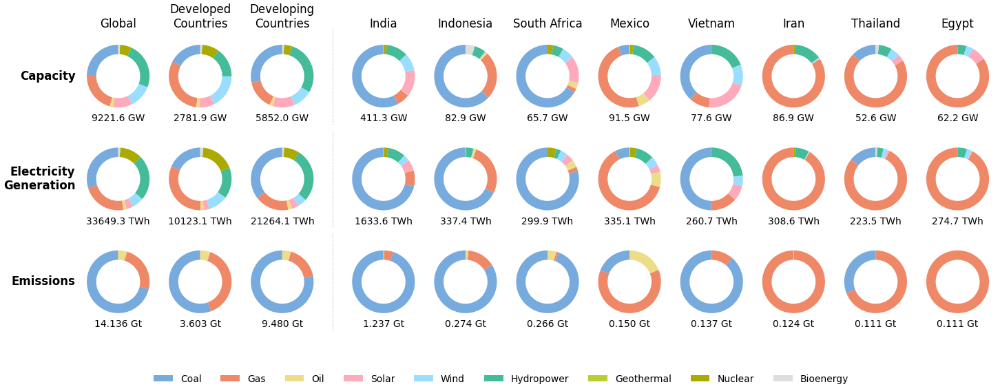

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scienceplots

def format_value(value, metric):
    """Format values based on their metric type and convert to appropriate units
    - capacity: MW to GW (divide by 1000)
    - activity: MWh to TWh (divide by 1,000,000)
    - emissions: Mt to Gt (divide by 1000)
    """
    if metric == 'capacity':
        # Convert MW to GW
        gw_value = value / 1000
        return f'{gw_value:.1f} GW'
    elif metric == 'activity':
        # Convert MWh to TWh
        twh_value = value / 1_000_000
        return f'{twh_value:.1f} TWh'
    else:  # emissions
        # Convert Mt to Gt
        gt_value = value / 1000
        return f'{gt_value:.3f} Gt'

def create_visualization(df, unfccc_df):
    plt.style.use(['science', 'nature', 'light'])
    
    plt.rcParams.update({
        'font.size': 16,
        'axes.labelsize': 16,
        'xtick.labelsize': 16,
        'ytick.labelsize': 16,
        'legend.fontsize': 18,
        'font.family': 'DejaVu Sans',
        'axes.linewidth': 0.5,
        'grid.linewidth': 0.5,
        'lines.linewidth': 1,
        'lines.markersize': 3,
        'text.usetex': False,
    })
    
    subsectors = ['Coal', 'Gas', 'Oil', 'Solar', 'Wind', 'Hydropower', 'Geothermal', 'Nuclear', 'Bioenergy']

    fig = plt.figure(figsize=(18, 7))
    
    gs = fig.add_gridspec(3, 13, height_ratios=[1, 1, 1], 
                         width_ratios=[0.5] + [1, 1, 1, 0.2] + [1]*8,
                         hspace=0.05,
                         wspace=0.05)

    row_labels = ['Capacity', 'Electricity\nGeneration', 'Emissions']
    metrics = ['capacity', 'activity', 'annualco2tyear']

    for row, (label, metric) in enumerate(zip(row_labels, metrics)):
        # Add row label
        ax_label = fig.add_subplot(gs[row, 0])
        ax_label.text(1.0, 0.5, label, ha='right', va='center', fontsize=12, fontweight='bold')
        ax_label.axis('off')

        # Process each column
        titles = ['Global', 'Developed\nCountries', 'Developing\nCountries']
        for col, title in enumerate(titles, start=1):
            ax = fig.add_subplot(gs[row, col])
            
            if title == 'Global':
                mask = df['status'] == 'operating'
            else:
                group = 'Developed Financiers' if 'Developed' in title else 'Developing Recipients'
                mask = (df['status'] == 'operating') & (df['unfccc_group'] == group)
            
            data = df[mask].groupby('subsector')[metric].sum()
            data = data.reindex(subsectors).fillna(0)
            
            total_value = data.sum()
            
            if total_value > 0:
                wedges, _ = ax.pie(data, 
                                 wedgeprops=dict(width=0.3), 
                                 startangle=90)
                # Add total value below the pie chart
                ax.text(0, -1.35, format_value(total_value, metric),
                       ha='center', va='center', fontsize=10)
            
            ax.axis('off')
            if row == 0:
                ax.set_title(title, pad=10, fontsize=12)

            if col == 3:
                ax_sep = fig.add_subplot(gs[row, col+1])
                ax_sep.axvline(x=0.5, color='gray', linestyle=':', linewidth=0.5)
                ax_sep.axis('off')

        # Add country plots
        countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG']
        country_names = ['India', 'Indonesia', 'South Africa', 'Mexico', 
                        'Vietnam', 'Iran', 'Thailand', 'Egypt']

        for i, (code, name) in enumerate(zip(countries, country_names)):
            ax = fig.add_subplot(gs[row, i+5])
            mask = (df['status'] == 'operating') & (df['asset_location'] == code)
            data = df[mask].groupby('subsector')[metric].sum()
            data = data.reindex(subsectors).fillna(0)
            
            total_value = data.sum()
            
            if total_value > 0:
                wedges, _ = ax.pie(data, 
                                 wedgeprops=dict(width=0.3), 
                                 startangle=90)
                # Add total value below the pie chart
                ax.text(0, -1.35, format_value(total_value, metric),
                       ha='center', va='center', fontsize=10)
            
            ax.axis('off')
            if row == 0:
                ax.set_title(name, pad=10, fontsize=12)

    # Legend
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    legend_elements = [plt.Rectangle((0,0),1,1, fc=color) 
                      for color in color_cycle[:len(subsectors)]]
    
    fig.legend(legend_elements, subsectors,
              loc='center', bbox_to_anchor=(0.5, 0.15),
              ncol=len(subsectors), fontsize=10)

    plt.subplots_adjust(bottom=0.25)  # Increased bottom margin to accommodate value labels
    plt.show()

def main():
    df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')
    unfccc_df = pd.read_excel('/Users/yukthabhadane/Documents/Climate Finance Thesis/Policy Brief/UNFCCC classification.xlsx')
    
    location_to_group = dict(zip(unfccc_df['asset_location'], unfccc_df['group']))
    df['unfccc_group'] = df['asset_location'].map(location_to_group)
    
    create_visualization(df, unfccc_df)

if __name__ == "__main__":
    main()

/var/folders/n_/wz0dpmns379dn5s9v5qcpxww0000gn/T/ipykernel_33942/3419385209.py:108: DtypeWarning: Columns (9,15,17,23,32,33) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')


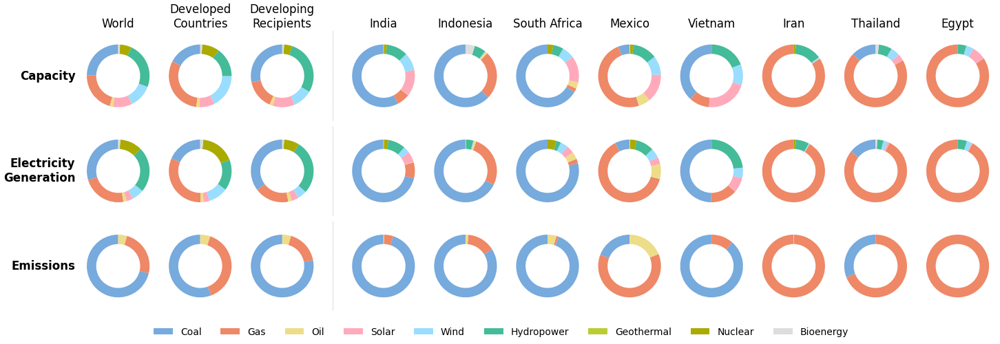

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scienceplots

def create_visualization(df, unfccc_df):
    # Set the plot style
    plt.style.use(['science', 'nature', 'light'])
    
    plt.rcParams.update({
        'font.size': 16,
        'axes.labelsize': 16,
        'xtick.labelsize': 16,
        'ytick.labelsize': 16,
        'legend.fontsize': 18,
        'font.family': 'DejaVu Sans',
        'axes.linewidth': 0.5,
        'grid.linewidth': 0.5,
        'lines.linewidth': 1,
        'lines.markersize': 3,
        'text.usetex': False,
    })
    
    subsectors = ['Coal', 'Gas', 'Oil', 'Solar', 'Wind', 'Hydropower', 'Geothermal', 'Nuclear', 'Bioenergy']

    # Create figure
    fig = plt.figure(figsize=(18, 6))
    
    # Create grid with proper spacing
    # Added one more column to accommodate all countries
    gs = fig.add_gridspec(3, 13, height_ratios=[1, 1, 1], 
                         width_ratios=[0.5] + [1, 1, 1, 0.2] + [1]*8,
                         hspace=0.05,    # Reduce vertical spacing
                         wspace=0.05)    # Reduce horizontal spacing

    row_labels = ['Capacity', 'Electricity\nGeneration', 'Emissions']
    metrics = ['capacity', 'activity', 'annual_co2_calc']

    for row, (label, metric) in enumerate(zip(row_labels, metrics)):
        # Add row label
        ax_label = fig.add_subplot(gs[row, 0])
        ax_label.text(1.0, 0.5, label, ha='right', va='center', fontsize=12, fontweight='bold')
        ax_label.axis('off')

        # Process each column
        titles = ['World', 'Developed\nCountries', 'Developing\nRecipients']
        for col, title in enumerate(titles, start=1):
            ax = fig.add_subplot(gs[row, col])
            
            # Get data based on category
            if title == 'World':
                mask = df['status'] == 'operating'
            else:
                group = 'Developed Financiers' if 'Developed' in title else 'Developing Recipients'
                mask = (df['status'] == 'operating') & (df['unfccc_group'] == group)
            
            data = df[mask].groupby('subsector')[metric].sum()
            data = data.reindex(subsectors).fillna(0)
            
            # Create donut chart
            if data.sum() > 0:
                wedges, _ = ax.pie(data, 
                                 wedgeprops=dict(width=0.3), 
                                 startangle=90)
            ax.axis('off')
            if row == 0:
                ax.set_title(title, pad=10, fontsize=12)

            # Add separator after third column
            if col == 3:
                ax_sep = fig.add_subplot(gs[row, col+1])
                ax_sep.axvline(x=0.5, color='gray', linestyle=':', linewidth=0.5)
                ax_sep.axis('off')

        # Add country plots
        countries = ['IN', 'ID', 'ZA', 'MX', 'VN', 'IR', 'TH', 'EG']
        country_names = ['India', 'Indonesia', 'South Africa', 'Mexico', 
                        'Vietnam', 'Iran', 'Thailand', 'Egypt']

        for i, (code, name) in enumerate(zip(countries, country_names)):
            ax = fig.add_subplot(gs[row, i+5])
            mask = (df['status'] == 'operating') & (df['asset_location'] == code)
            data = df[mask].groupby('subsector')[metric].sum()
            data = data.reindex(subsectors).fillna(0)
            
            if data.sum() > 0:
                wedges, _ = ax.pie(data, 
                                 wedgeprops=dict(width=0.3), 
                                 startangle=90)
            ax.axis('off')
            if row == 0:
                ax.set_title(name, pad=10, fontsize=12)

    # Get colors from current color cycle for legend
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    legend_elements = [plt.Rectangle((0,0),1,1, fc=color) 
                      for color in color_cycle[:len(subsectors)]]
    
    fig.legend(legend_elements, subsectors,
              loc='center', bbox_to_anchor=(0.5, 0.15),  # Moved legend up
              ncol=len(subsectors), fontsize=10)

    plt.subplots_adjust(bottom=0.2)  # Adjust to prevent legend overlap
    plt.show()

def main():
    # Load data
    df = pd.read_csv('/Users/yukthabhadane/Documents/Climate Finance Thesis/Data/v3_power_Forward_Analytics2024.csv')
    unfccc_df = pd.read_excel('/Users/yukthabhadane/Documents/Climate Finance Thesis/Policy Brief/UNFCCC classification.xlsx')
    
    # Add UNFCCC classifications
    location_to_group = dict(zip(unfccc_df['asset_location'], unfccc_df['group']))
    df['unfccc_group'] = df['asset_location'].map(location_to_group)
    
    # Create single visualization
    create_visualization(df, unfccc_df)

if __name__ == "__main__":
    main()